In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler, QuantileTransformer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC

In [ ]:
#read the data
df = pd.read_csv("data.csv")

In [ ]:
df.head()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR.AXIS ASPECT RATIO,MAX.LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR.AXIS RECTANGULARITY,MAX.LENGTH RECTANGULARITY,SCALED VARIANCE ALONG MAJOR AXIS,SCALED VARIANCE ALONG MINOR AXIS,SCALED RADIUS OF GYRATION,SKEWNESS ABOUT MAJOR AXIS,SKEWNESS ABOUT MINOR AXIS,KURTOSIS ABOUT MINOR AXIS,KURTOSIS ABOUT MAJOR AXIS,HOLLOWS RATIO,TARGET
0,95,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van
1,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,van
2,104,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196,saab
3,93,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207,van
4,85,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183,bus


In [ ]:
df.tail()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR.AXIS ASPECT RATIO,MAX.LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR.AXIS RECTANGULARITY,MAX.LENGTH RECTANGULARITY,SCALED VARIANCE ALONG MAJOR AXIS,SCALED VARIANCE ALONG MINOR AXIS,SCALED RADIUS OF GYRATION,SKEWNESS ABOUT MAJOR AXIS,SKEWNESS ABOUT MINOR AXIS,KURTOSIS ABOUT MINOR AXIS,KURTOSIS ABOUT MAJOR AXIS,HOLLOWS RATIO,TARGET
841,93,39,87,183,64,8,169,40,20,134,200,422,149,72,7,25,188,195,saab
842,89,46,84,163,66,11,159,43,20,159,173,368,176,72,1,20,186,197,van
843,106,54,101,222,67,12,222,30,25,173,228,721,200,70,3,4,187,201,saab
844,86,36,78,146,58,7,135,50,18,124,155,270,148,66,0,25,190,195,saab
845,85,36,66,123,55,5,120,56,17,128,140,212,131,73,1,18,186,190,van


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   COMPACTNESS                       846 non-null    int64 
 1   CIRCULARITY                       846 non-null    int64 
 2   DISTANCE CIRCULARITY              846 non-null    int64 
 3   RADIUS RATIO                      846 non-null    int64 
 4   PR.AXIS ASPECT RATIO              846 non-null    int64 
 5   MAX.LENGTH ASPECT RATIO           846 non-null    int64 
 6   SCATTER RATIO                     846 non-null    int64 
 7   ELONGATEDNESS                     846 non-null    int64 
 8   PR.AXIS RECTANGULARITY            846 non-null    int64 
 9   MAX.LENGTH RECTANGULARITY         846 non-null    int64 
 10  SCALED VARIANCE ALONG MAJOR AXIS  846 non-null    int64 
 11  SCALED VARIANCE ALONG MINOR AXIS  846 non-null    int64 
 12  SCALED RADIUS OF GYRAT

In [ ]:
df.describe()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR.AXIS ASPECT RATIO,MAX.LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR.AXIS RECTANGULARITY,MAX.LENGTH RECTANGULARITY,SCALED VARIANCE ALONG MAJOR AXIS,SCALED VARIANCE ALONG MINOR AXIS,SCALED RADIUS OF GYRATION,SKEWNESS ABOUT MAJOR AXIS,SKEWNESS ABOUT MINOR AXIS,KURTOSIS ABOUT MINOR AXIS,KURTOSIS ABOUT MAJOR AXIS,HOLLOWS RATIO
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.00000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.861702,82.088652,168.940898,61.693853,8.567376,168.839243,40.933806,20.582742,147.998818,188.625296,439.911348,174.70331,72.462175,6.377069,12.599291,188.932624,195.632388
std,8.234474,6.169866,15.771533,33.472183,7.888251,4.601217,33.244978,7.811560,2.592138,14.515652,31.394837,176.692614,32.54649,7.486974,4.918353,8.931240,6.163949,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.00000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,146.250000,33.000000,19.000000,137.000000,167.000000,318.250000,149.00000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.500000,364.000000,173.00000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.00000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.00000,135.000000,22.000000,41.000000,206.000000,211.000000


In [ ]:
df.isnull().mean() * 100

COMPACTNESS                         0.0
CIRCULARITY                         0.0
DISTANCE CIRCULARITY                0.0
RADIUS RATIO                        0.0
PR.AXIS ASPECT RATIO                0.0
MAX.LENGTH ASPECT RATIO             0.0
SCATTER RATIO                       0.0
ELONGATEDNESS                       0.0
PR.AXIS RECTANGULARITY              0.0
MAX.LENGTH RECTANGULARITY           0.0
SCALED VARIANCE ALONG MAJOR AXIS    0.0
SCALED VARIANCE ALONG MINOR AXIS    0.0
SCALED RADIUS OF GYRATION           0.0
SKEWNESS ABOUT MAJOR AXIS           0.0
SKEWNESS ABOUT MINOR AXIS           0.0
KURTOSIS ABOUT MINOR AXIS           0.0
KURTOSIS ABOUT MAJOR AXIS           0.0
HOLLOWS RATIO                       0.0
TARGET                              0.0
dtype: float64

In [ ]:
df[df.duplicated()]

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR.AXIS ASPECT RATIO,MAX.LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR.AXIS RECTANGULARITY,MAX.LENGTH RECTANGULARITY,SCALED VARIANCE ALONG MAJOR AXIS,SCALED VARIANCE ALONG MINOR AXIS,SCALED RADIUS OF GYRATION,SKEWNESS ABOUT MAJOR AXIS,SKEWNESS ABOUT MINOR AXIS,KURTOSIS ABOUT MINOR AXIS,KURTOSIS ABOUT MAJOR AXIS,HOLLOWS RATIO,TARGET


In [ ]:
df.nunique()

COMPACTNESS                          44
CIRCULARITY                          27
DISTANCE CIRCULARITY                 63
RADIUS RATIO                        134
PR.AXIS ASPECT RATIO                 37
MAX.LENGTH ASPECT RATIO              21
SCATTER RATIO                       131
ELONGATEDNESS                        35
PR.AXIS RECTANGULARITY               13
MAX.LENGTH RECTANGULARITY            66
SCALED VARIANCE ALONG MAJOR AXIS    128
SCALED VARIANCE ALONG MINOR AXIS    424
SCALED RADIUS OF GYRATION           143
SKEWNESS ABOUT MAJOR AXIS            39
SKEWNESS ABOUT MINOR AXIS            23
KURTOSIS ABOUT MINOR AXIS            41
KURTOSIS ABOUT MAJOR AXIS            30
HOLLOWS RATIO                        31
TARGET                                4
dtype: int64

In [ ]:
X = df.drop(columns="TARGET")
Y = df[["TARGET"]]

In [ ]:
#histogram
def histogram(x):
  n = len(x.columns)

  plt.figure(figsize = (15, 25))

  for i in range(n):
    plt.subplot(6, 3, i+1)
    sns.histplot( x = x[x.columns[i]], bins=30, color='blue', edgecolor='black', kde=True)
    plt.xlabel(x.columns[i])
    plt.ylabel('Frequency')
  plt.show()

In [ ]:
#bargraph
def bargraph(y):
  plt.figure(figsize = (5,5))
  sns.countplot(y = "TARGET", data = y)
  plt.show()

In [ ]:
#category wise histograms
def category_wise_hist(x, y):
  target_categories = ['van', 'saab', 'bus', 'opel']
  for category in target_categories:
      df_category = x[y["TARGET"] == category]

      plt.figure(figsize=(15, 30))

      for i in range(len(x.columns)):
          plt.subplot(6, 3, i + 1)
          feature = x.columns[i]
          sns.histplot(df_category[feature].dropna(), bins=30, color='blue', edgecolor='black', kde=True)
          plt.xlabel(feature)
          plt.ylabel('Frequency')
          plt.title(f'Histogram of {feature} ({category})')

      plt.tight_layout()
      plt.show()

In [ ]:
#boxplot
def boxplot(x):
  plt.figure(figsize = (15, 20))
  for i in range(18):
    plt.subplot(6, 3, i+1)
    sns.boxplot( data = x[x.columns[i]])
  plt.show()

In [ ]:
#correlation matrix
def correlation_matrix(x):
  correlation_matrix = x.corr()

  plt.figure(figsize=(15, 10))
  sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
  plt.show()

In [ ]:
#remove outliers
def remove_outliers(x):
    for col in x.columns[:18]:
        Q1 = x[col].quantile(0.25)
        Q3 = x[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        x = x[(x[col] >= lower_bound) & (x[col] <= upper_bound)]
    return x

In [ ]:
#transform distributions
def quantile_transform(x):
  n_samples = len(x)
  qt = QuantileTransformer(n_quantiles=n_samples, output_distribution='normal', random_state=0)
  for col in x.columns:
    x[col] = qt.fit_transform(x[[col]])

  return x

In [ ]:
#confusion matrix
def confusionMatrix(actual, prediction):
  conf_matrix = confusion_matrix(actual, prediction)
  sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title('Confusion Matrix')
  plt.show()

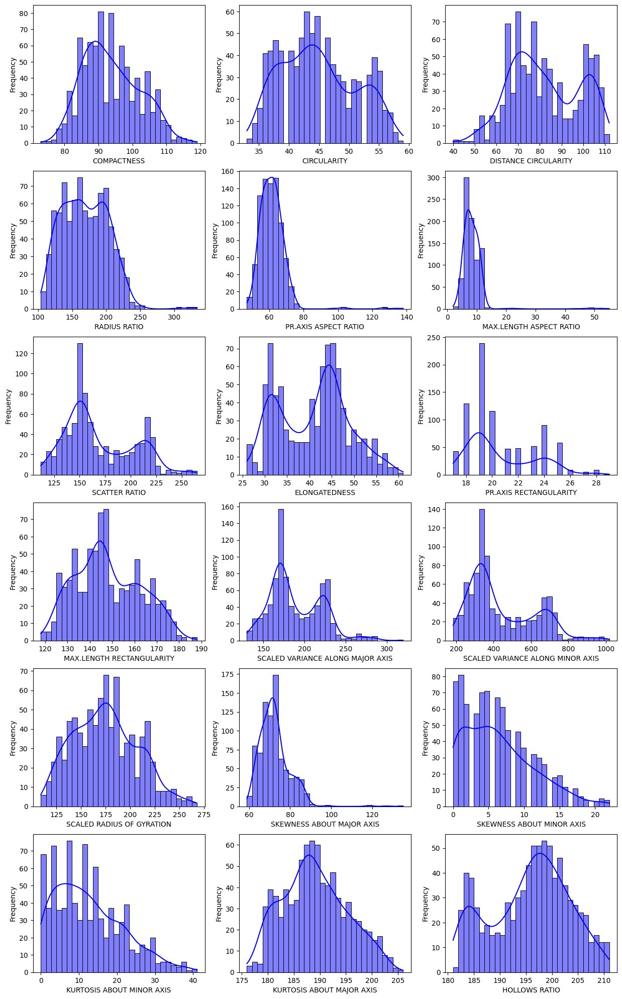

In [ ]:
histogram(X)

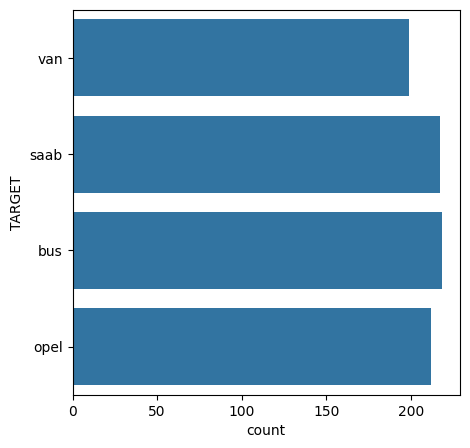

In [ ]:
bargraph(Y)

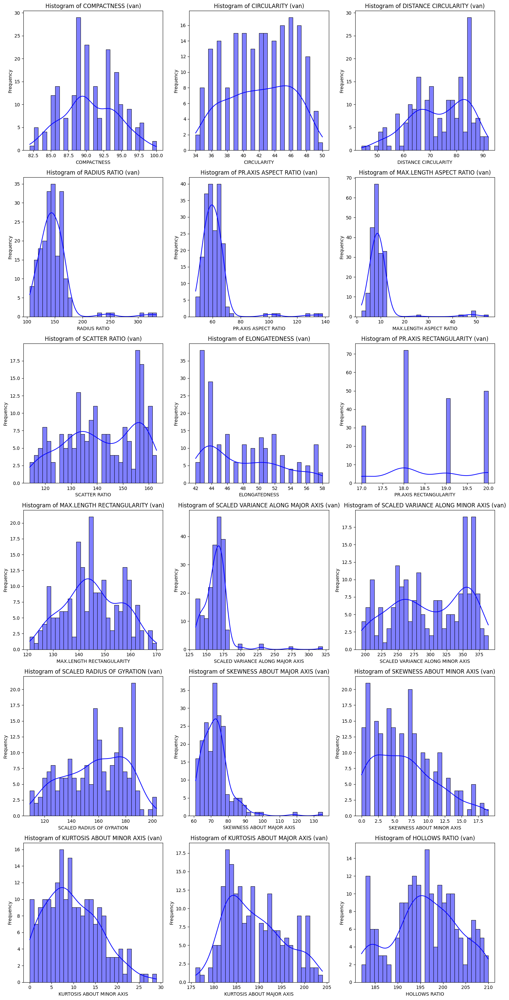

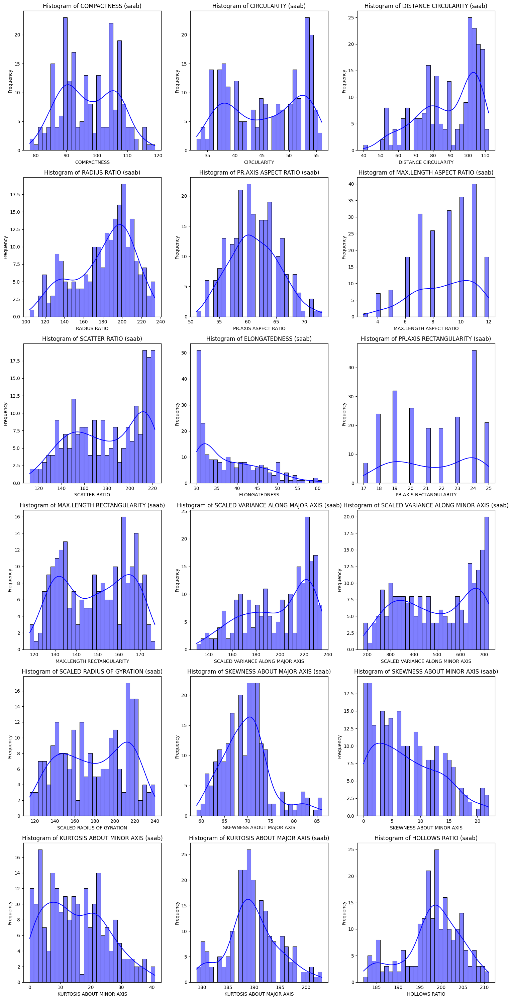

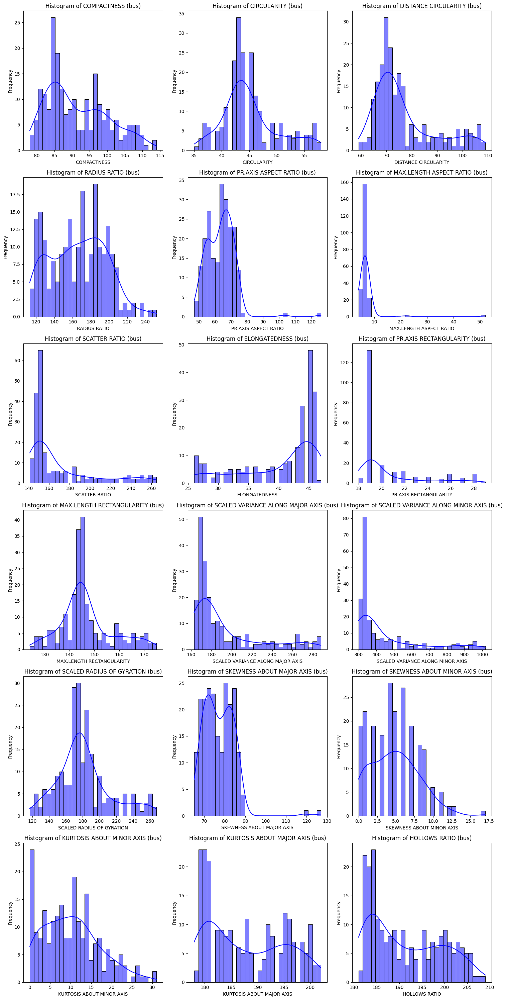

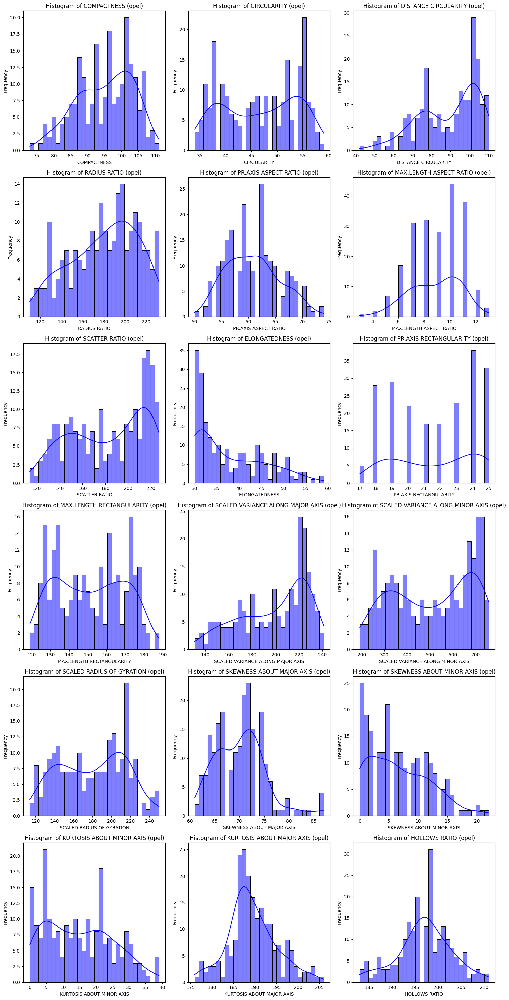

In [ ]:
category_wise_hist(X, Y)

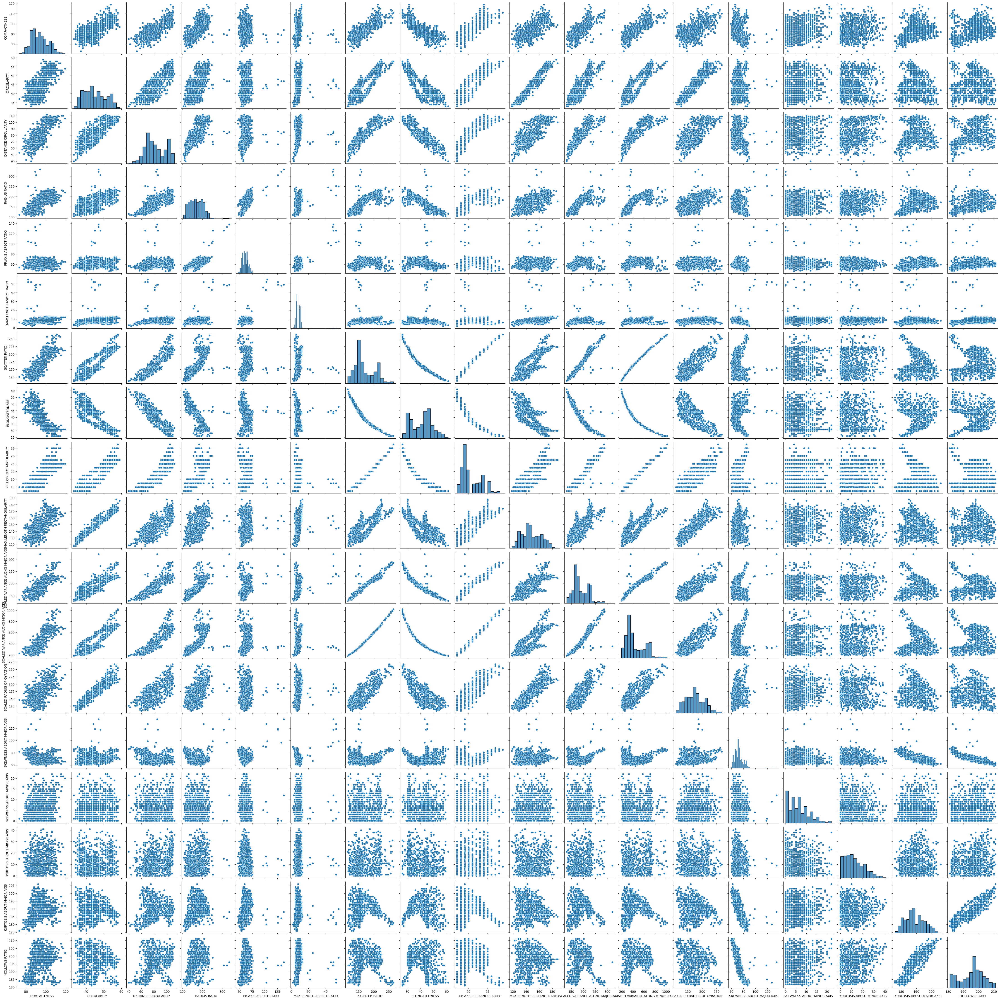

In [ ]:
sns.pairplot(df)

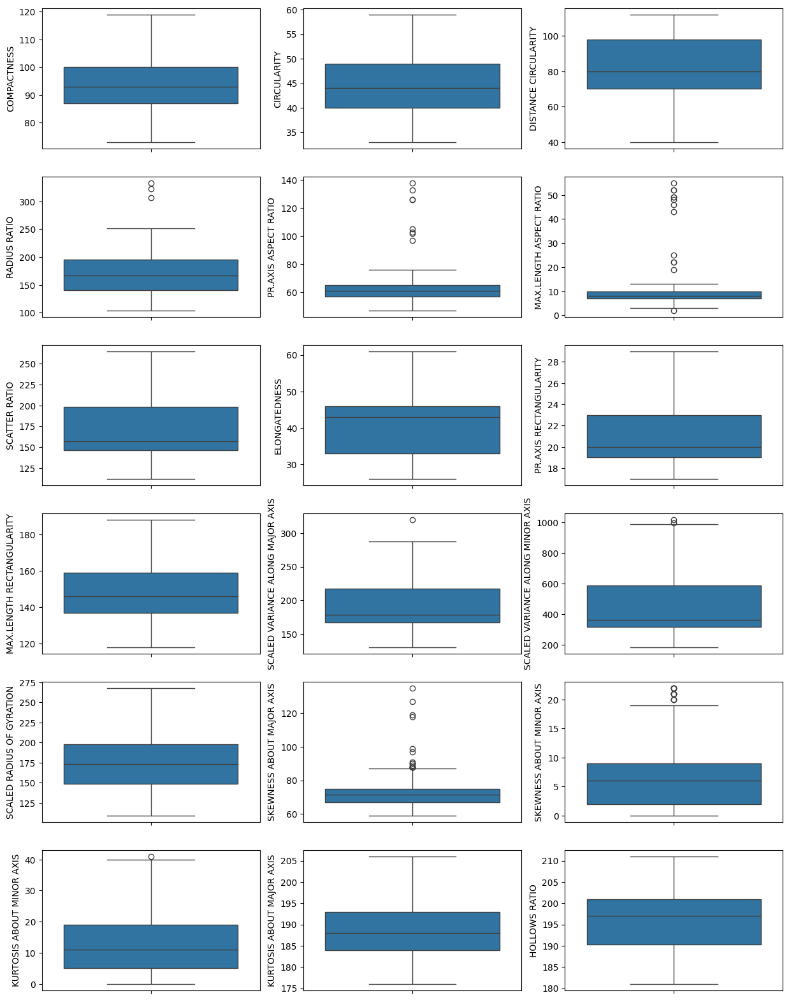

In [ ]:
boxplot(X)

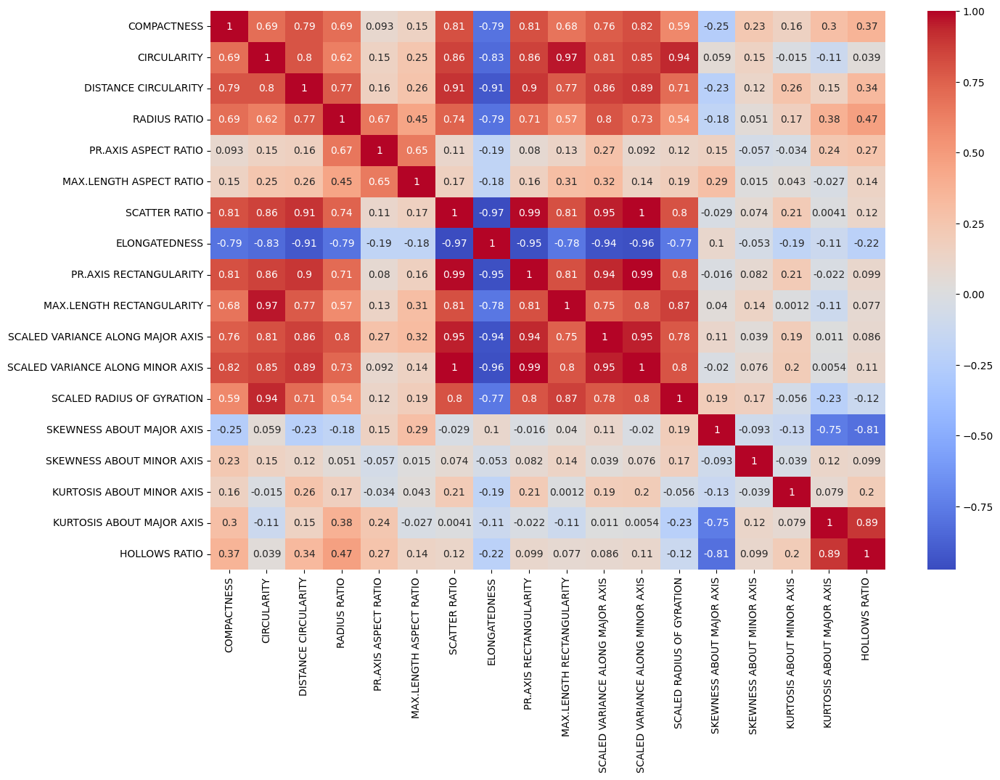

In [ ]:
correlation_matrix(X)

In [ ]:
training_data, testing_data = train_test_split(df, test_size = 0.2, stratify=df.TARGET, random_state = 0)

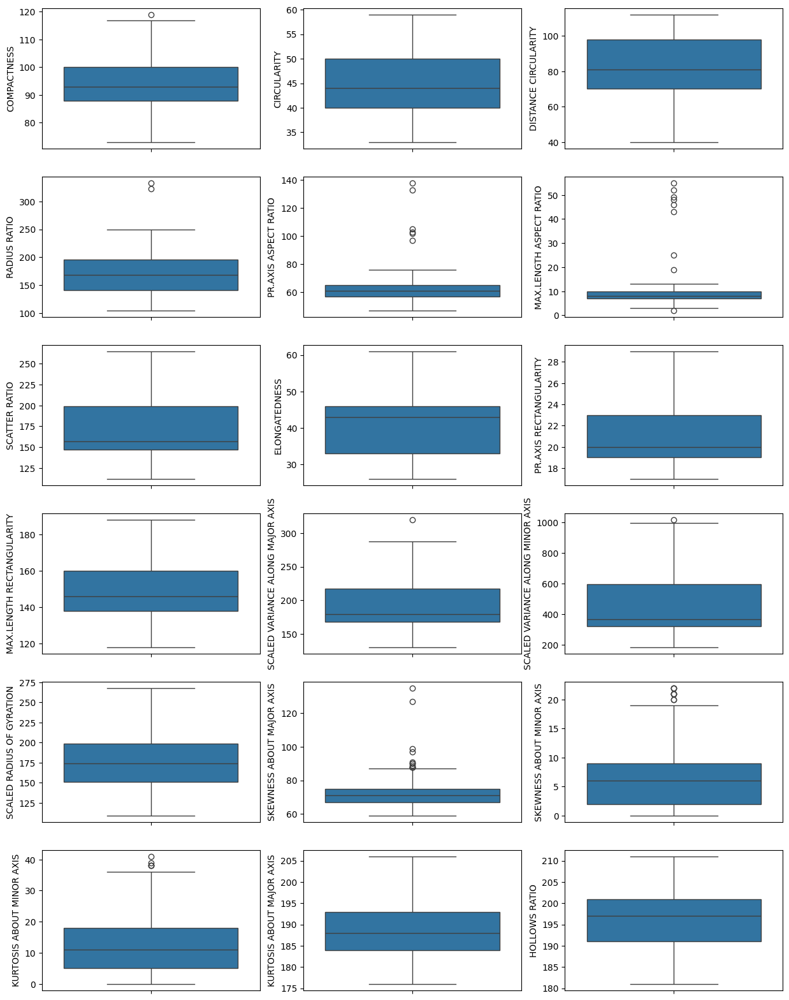

In [ ]:
boxplot(training_data)

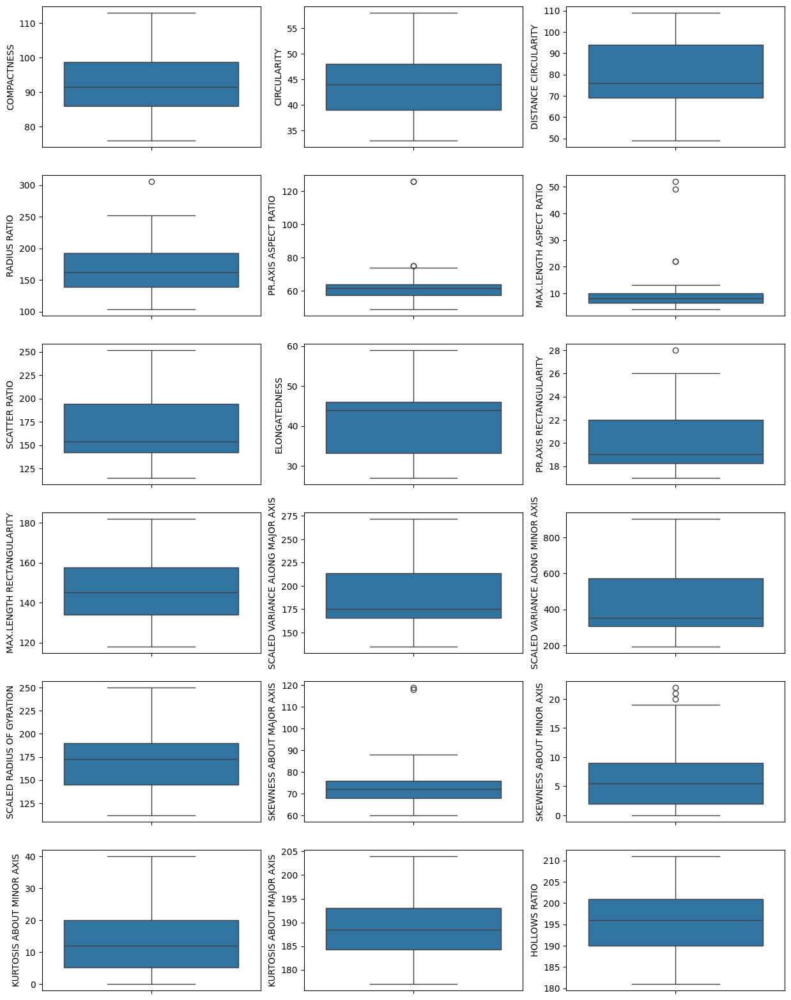

In [ ]:
boxplot(testing_data)

In [ ]:
training_outliers = remove_outliers(training_data)
testing_outliers = remove_outliers(testing_data)

In [ ]:
training_outliers.loc[training_outliers['TARGET'] == 'opel', training_outliers.columns != 'TARGET'] *= 1.5
testing_outliers.loc[testing_outliers['TARGET'] == 'opel', testing_outliers.columns != 'TARGET'] *= 1.5

In [ ]:
x_train = training_outliers.drop("TARGET", axis = 'columns')
y_train = training_outliers[["TARGET"]]

In [ ]:
x_test = testing_outliers.drop("TARGET", axis = 'columns')
y_test = testing_outliers[["TARGET"]]

In [ ]:
#combine attributes
x_train['Combined_Aspect_Ratio'] = (x_train['PR.AXIS ASPECT RATIO'] + x_train['MAX.LENGTH ASPECT RATIO']) / 2

x_train['Shape_Descriptor'] = (x_train['COMPACTNESS'] + x_train['CIRCULARITY'] + 1/x_train['RADIUS RATIO']) / 3

x_train['Variance_Skewness_Composite'] = (
    x_train['SCALED VARIANCE ALONG MAJOR AXIS'] +
    x_train['SKEWNESS ABOUT MAJOR AXIS'] +
    x_train['SCALED VARIANCE ALONG MINOR AXIS'] +
    x_train['SKEWNESS ABOUT MINOR AXIS']
) / 4

x_train['Rectangularity_Composite'] = (x_train['PR.AXIS RECTANGULARITY'] + x_train['MAX.LENGTH RECTANGULARITY']) / 2

x_train['Scatter_Gyration_Composite'] = (x_train['SCATTER RATIO'] + x_train['SCALED RADIUS OF GYRATION']) / 2

x_train['Kurtosis_Composite'] = (x_train['KURTOSIS ABOUT MINOR AXIS'] + x_train['KURTOSIS ABOUT MAJOR AXIS']) / 2

In [ ]:
features_to_remove = ['PR.AXIS ASPECT RATIO', 'MAX.LENGTH ASPECT RATIO', 'COMPACTNESS', 'CIRCULARITY', 'RADIUS RATIO',
                      'SCALED VARIANCE ALONG MAJOR AXIS', 'SKEWNESS ABOUT MAJOR AXIS', 'SCALED VARIANCE ALONG MINOR AXIS',
                      'SKEWNESS ABOUT MINOR AXIS', 'PR.AXIS RECTANGULARITY', 'MAX.LENGTH RECTANGULARITY', 'SCATTER RATIO',
                      'SCALED RADIUS OF GYRATION', 'KURTOSIS ABOUT MINOR AXIS', 'KURTOSIS ABOUT MAJOR AXIS']

x_train = x_train.drop(columns=features_to_remove)

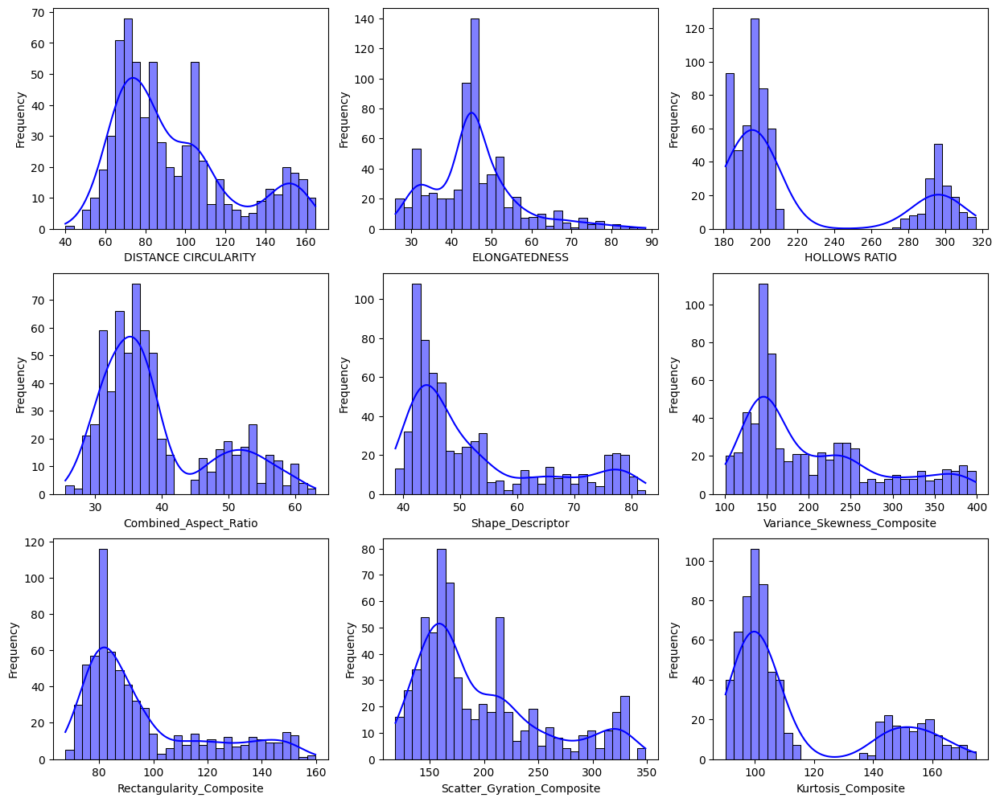

In [ ]:
histogram(x_train)

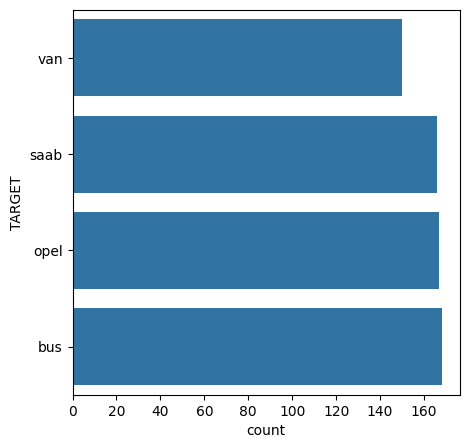

In [ ]:
bargraph(y_train)

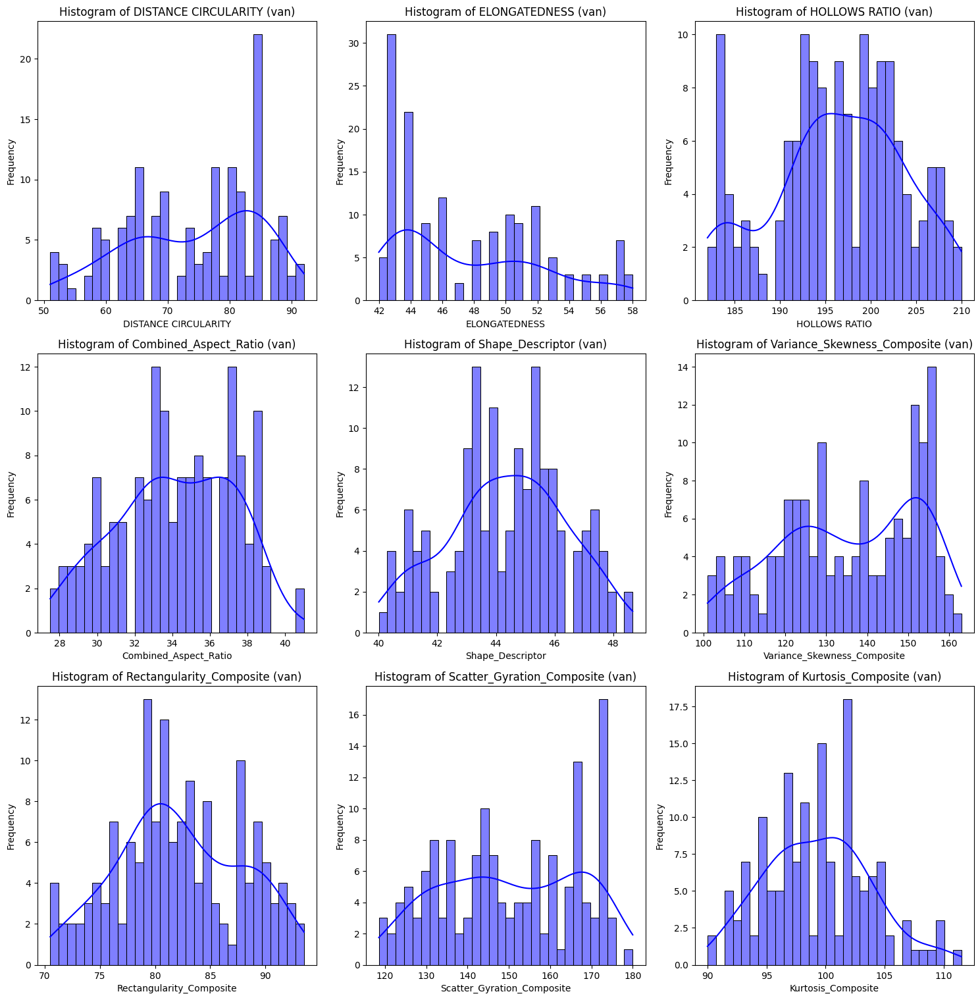

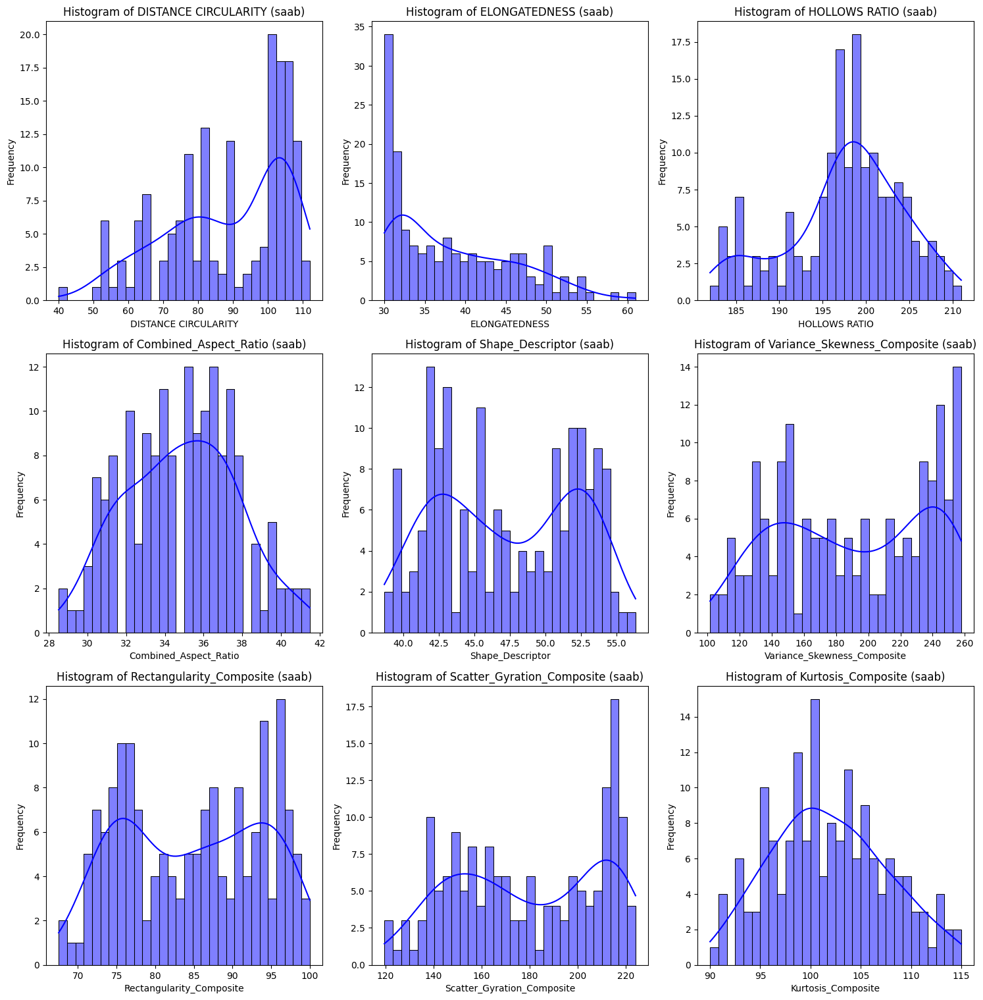

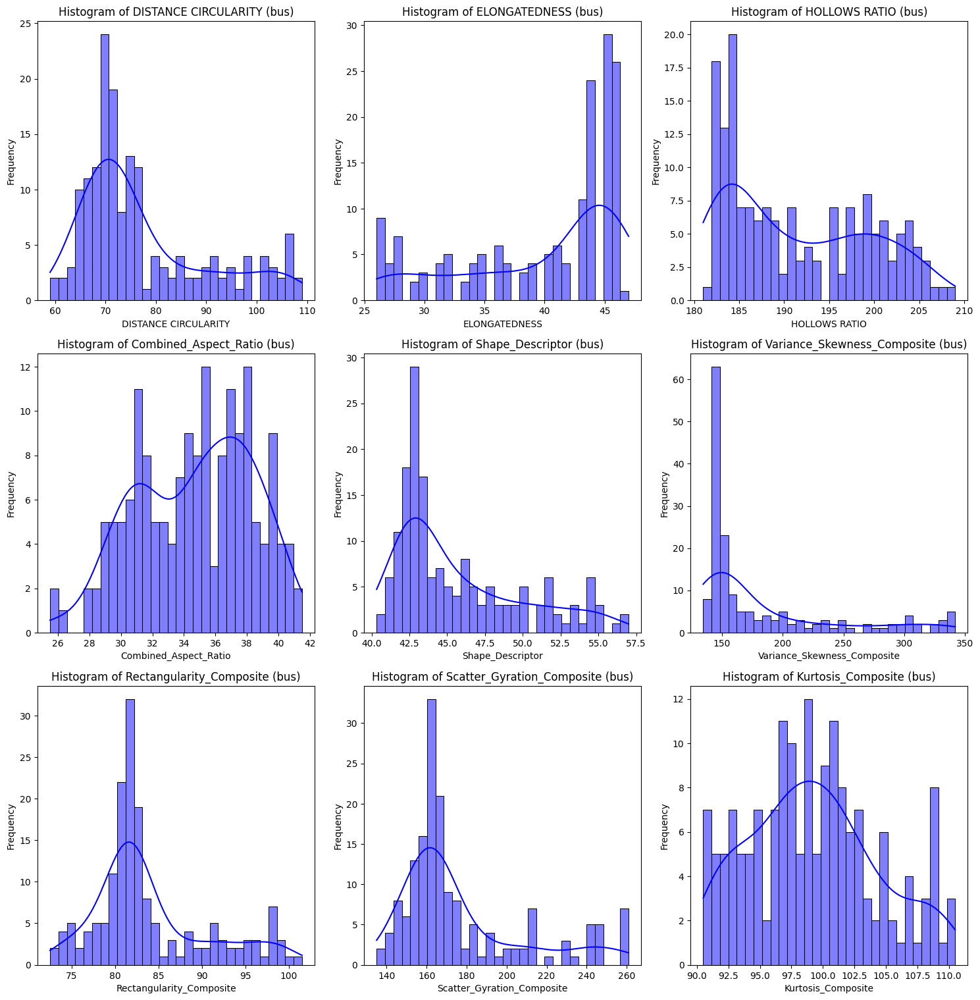

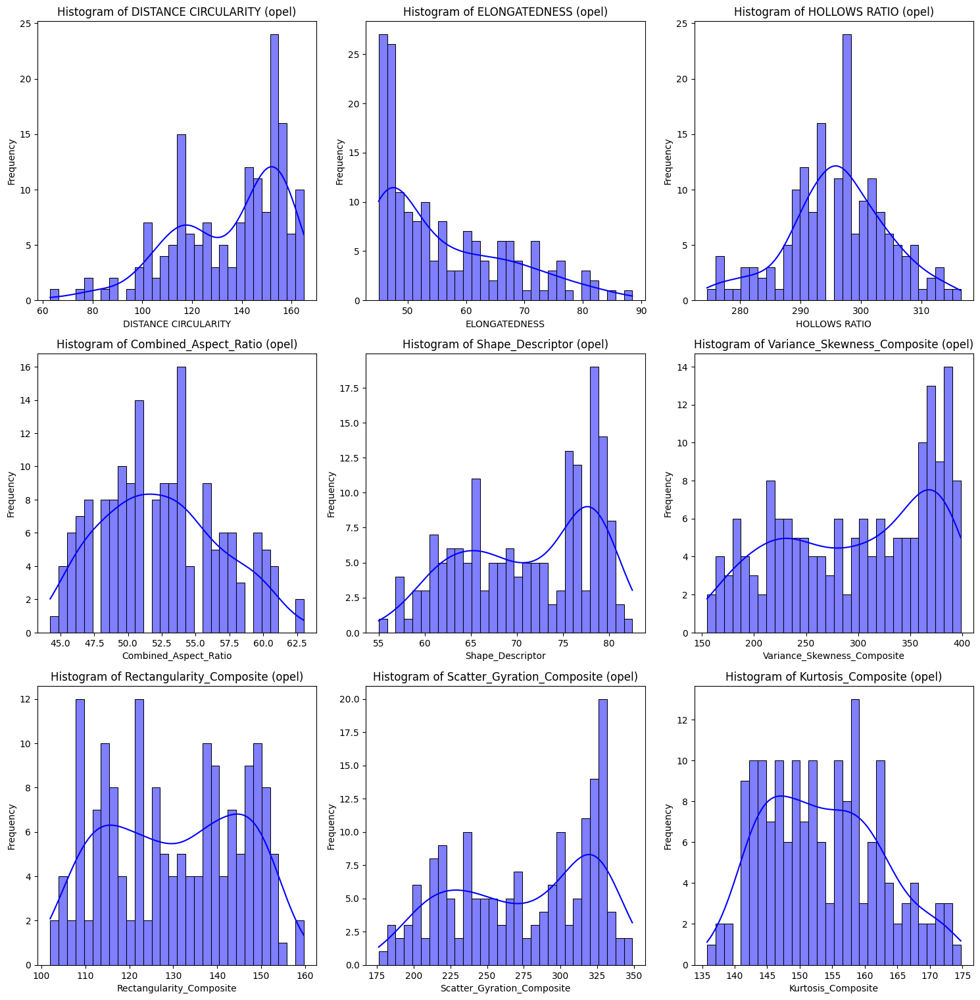

In [ ]:
category_wise_hist(x_train, y_train)

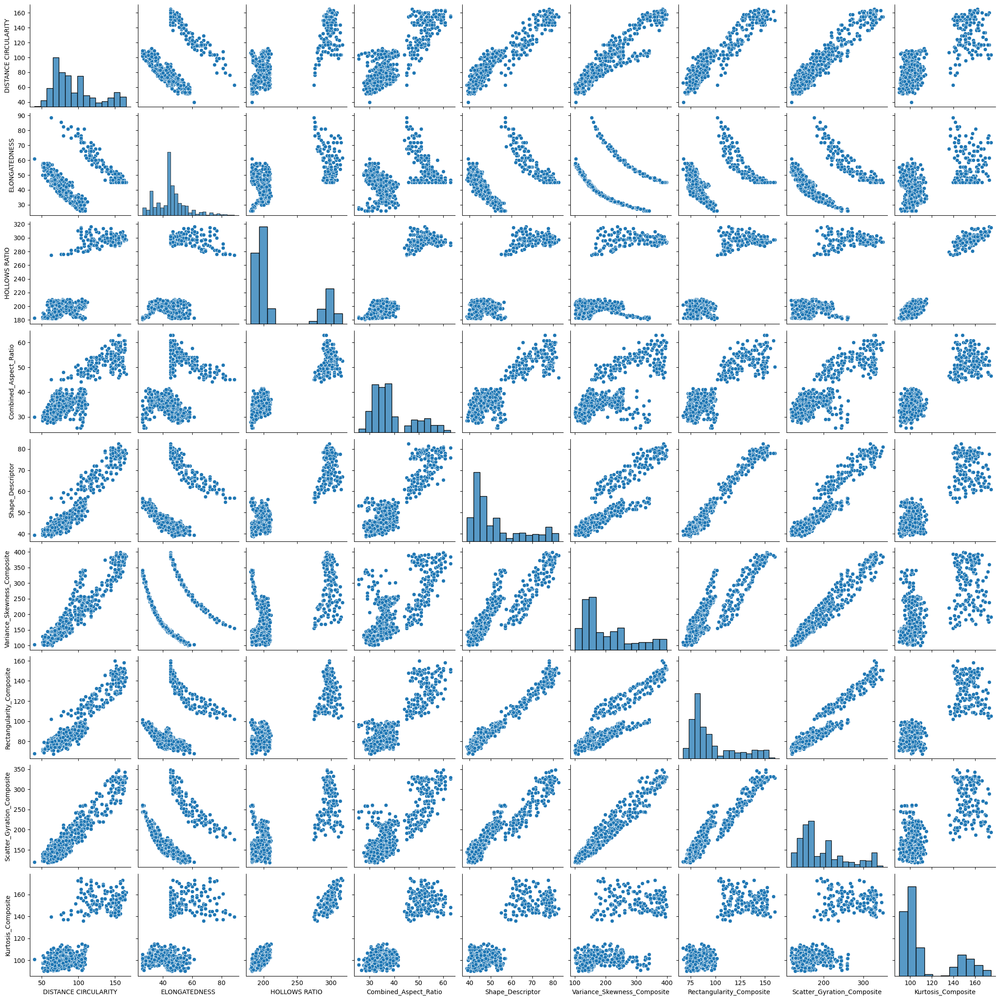

In [ ]:
sns.pairplot(x_train)

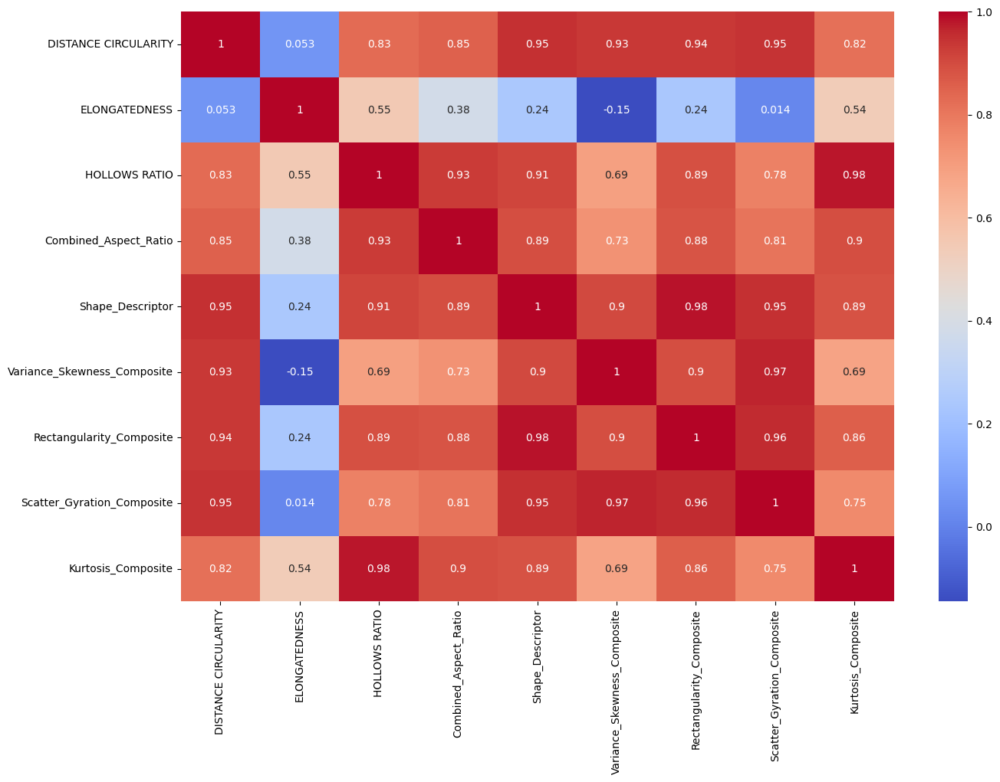

In [ ]:
correlation_matrix(x_train)

In [ ]:
x_train = quantile_transform(x_train)

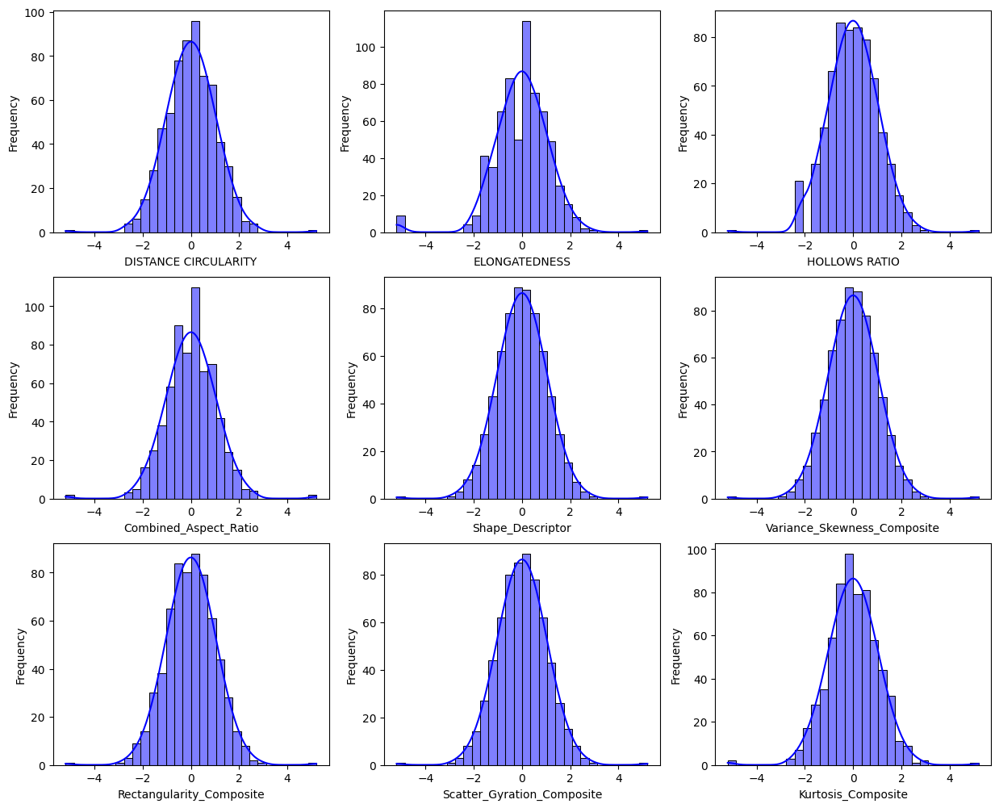

In [ ]:
histogram(x_train)

In [ ]:
x_test['Combined_Aspect_Ratio'] = (x_test['PR.AXIS ASPECT RATIO'] + x_test['MAX.LENGTH ASPECT RATIO']) / 2

x_test['Shape_Descriptor'] = (x_test['COMPACTNESS'] + x_test['CIRCULARITY'] + 1/x_test['RADIUS RATIO']) / 3

x_test['Variance_Skewness_Composite'] = (
    x_test['SCALED VARIANCE ALONG MAJOR AXIS'] +
    x_test['SKEWNESS ABOUT MAJOR AXIS'] +
    x_test['SCALED VARIANCE ALONG MINOR AXIS'] +
    x_test['SKEWNESS ABOUT MINOR AXIS']
) / 4

x_test['Rectangularity_Composite'] = (x_test['PR.AXIS RECTANGULARITY'] + x_test['MAX.LENGTH RECTANGULARITY']) / 2

x_test['Scatter_Gyration_Composite'] = (x_test['SCATTER RATIO'] + x_test['SCALED RADIUS OF GYRATION']) / 2

x_test['Kurtosis_Composite'] = (x_test['KURTOSIS ABOUT MINOR AXIS'] + x_test['KURTOSIS ABOUT MAJOR AXIS']) / 2

In [ ]:
features_to_remove = ['PR.AXIS ASPECT RATIO', 'MAX.LENGTH ASPECT RATIO', 'COMPACTNESS', 'CIRCULARITY', 'RADIUS RATIO',
                      'SCALED VARIANCE ALONG MAJOR AXIS', 'SKEWNESS ABOUT MAJOR AXIS', 'SCALED VARIANCE ALONG MINOR AXIS',
                      'SKEWNESS ABOUT MINOR AXIS', 'PR.AXIS RECTANGULARITY', 'MAX.LENGTH RECTANGULARITY', 'SCATTER RATIO',
                      'SCALED RADIUS OF GYRATION', 'KURTOSIS ABOUT MINOR AXIS', 'KURTOSIS ABOUT MAJOR AXIS']

x_test = x_test.drop(columns=features_to_remove)

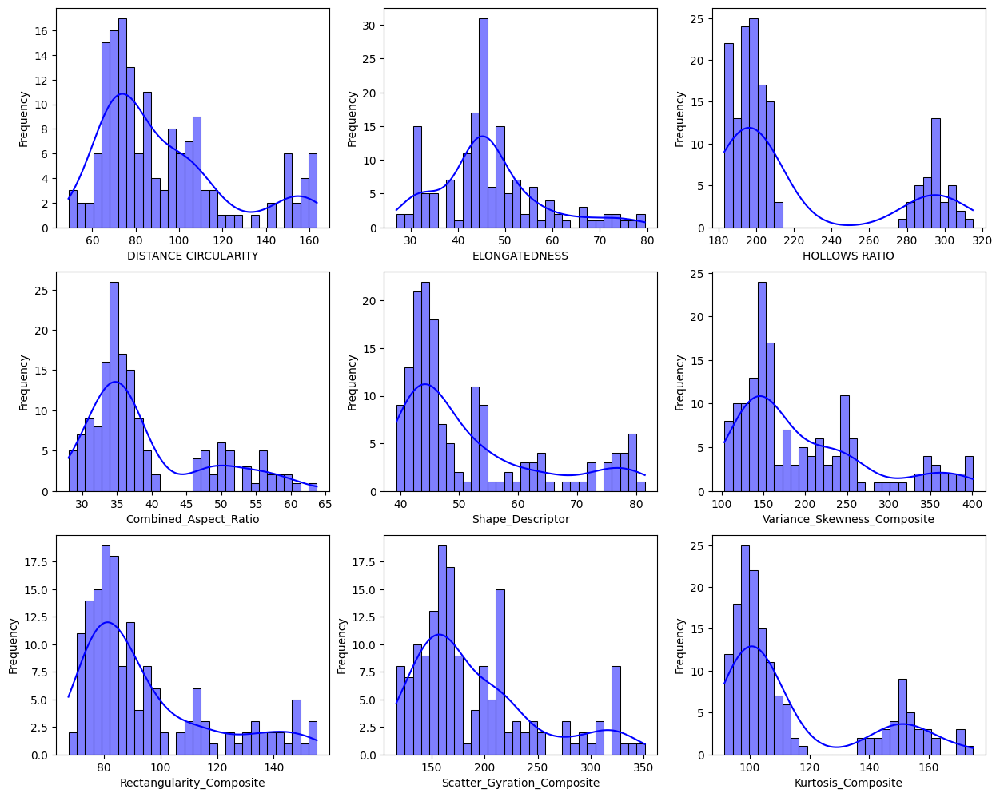

In [ ]:
histogram(x_test)

In [ ]:
x_test = quantile_transform(x_test)

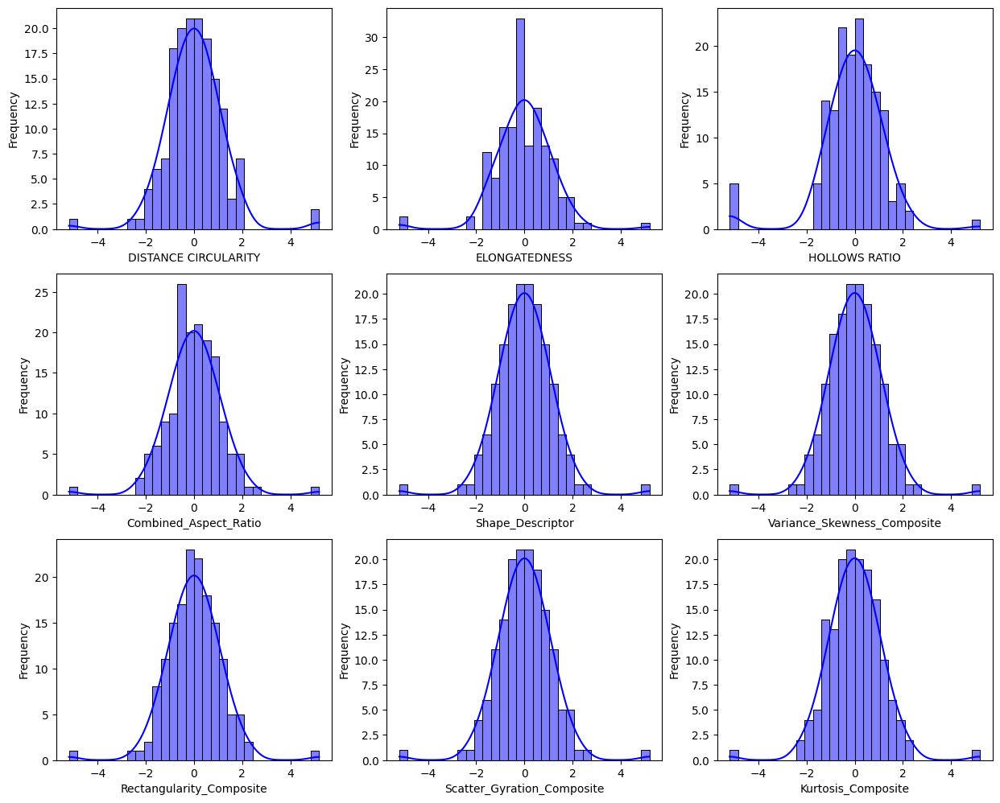

In [ ]:
histogram(x_test)

In [ ]:
#scaling
scaler = StandardScaler()
x_train_std = scaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train_std, columns = x_train.columns)
x_test_std = scaler.fit_transform(x_test)
x_test = pd.DataFrame(x_test_std, columns = x_test.columns)

In [ ]:
#training models
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

svm = SVC(kernel = 'rbf', C = 1, gamma = 0.1)
svm.fit(x_train, y_train.values.ravel())

training_pred_svm = svm.predict(x_train)
print(f"Training Accuracy = {accuracy_score(y_train, training_pred_svm)}")

testing_pred_svm = svm.predict(x_test)
print(f"Testing Accuracy = {accuracy_score(y_test, testing_pred_svm)}")

Training Accuracy = 0.9431643625192012
Testing Accuracy = 0.9177215189873418


In [ ]:
print(classification_report(y_test, testing_pred_svm))

              precision    recall  f1-score   support

         bus       0.91      0.81      0.86        37
        opel       1.00      1.00      1.00        39
        saab       0.93      0.88      0.90        43
         van       0.84      0.97      0.90        39

    accuracy                           0.92       158
   macro avg       0.92      0.92      0.92       158
weighted avg       0.92      0.92      0.92       158



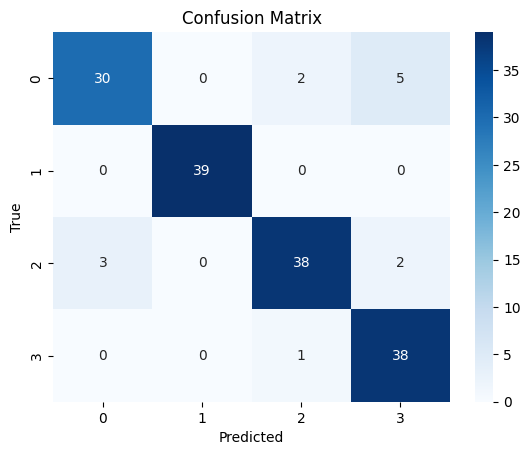

In [ ]:
confusionMatrix(y_test, testing_pred_svm)

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(max_iter=3000, learning_rate_init = 0.001, alpha = 2 , learning_rate = 'adaptive', hidden_layer_sizes = (100, 100, 50))
mlp.fit(x_train, y_train.values.ravel())

Training_pred_mpl= mlp.predict(x_train)
print(f"Training Accuracy = {accuracy_score(y_train, Training_pred_mpl)}")

Testing_pred_mlp = mlp.predict(x_test)
print(f"Testing Accuracy = {accuracy_score(y_test, Testing_pred_mlp)}")

Training Accuracy = 0.9554531490015361
Testing Accuracy = 0.9240506329113924


In [ ]:
print(classification_report(y_test, Testing_pred_mlp))

              precision    recall  f1-score   support

         bus       0.91      0.86      0.89        37
        opel       1.00      1.00      1.00        39
        saab       0.91      0.91      0.91        43
         van       0.88      0.92      0.90        39

    accuracy                           0.92       158
   macro avg       0.92      0.92      0.92       158
weighted avg       0.92      0.92      0.92       158



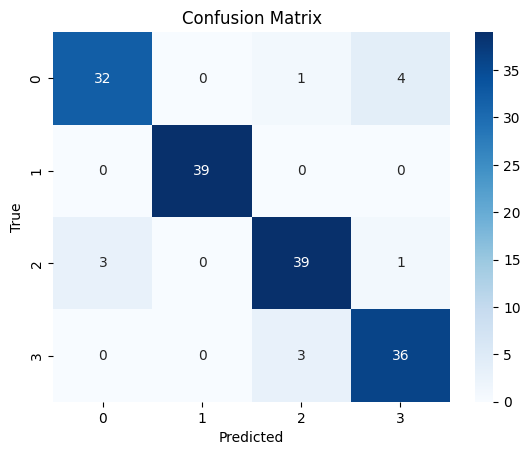

In [ ]:
confusionMatrix(y_test, Testing_pred_mlp)